<a href="https://colab.research.google.com/github/chrisnelsonlab/BMEG4623/blob/master/1_Transport_introduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<img src=https://brand.uark.edu/_resources/images/UA_Logo_Horizontal.jpg width="400" height="96">

#### BMEG 4623 - Tranposrt phenomenon in biomedical engineering
#### For more information, check out the Nelson lab for Therapeutic Genome Engineering (https://nelsonlab.uark.edu/)

#### Lecture 3
For image credits, see the linked URL

#### Disclaimer
I am not a computer scientist and have learned python as more of a hobby. There are certainly more efficient ways to do many of the demonstrations we are doing. Feel free to send me optimized or better code.



# 1.Introduction

The goal for today is to introduce transport phenomenon and the driving force behind transport processes. We will begin the class with the end in mind. What drives the flux of momentum, heat, and mass across gradients?

Therefore: our first goal is to understand and model Brownian Motion



## Introduction to Brownian Motion

Brownian motion refers to the random, erratic movement of microscopic particles suspended in a fluid (liquid or gas). This motion is caused by countless collisions between the suspended particles and the much smaller, rapidly moving molecules of the fluid.

The phenomenon was first observed by the botanist Robert Brown in 1827 while studying pollen grains in water. Although he could not explain the cause, later scientists, including Albert Einstein (1905), showed that Brownian motion provided strong evidence for the existence of atoms and molecules. We can understand a lot of transport processes based on this phenomenon. The motion observed during Brownian Motion can be related to the diffusivity of the mass species, for example.


<img src=
https://upload.wikimedia.org/wikipedia/commons/b/ba/Robert_brown_botaniker.jpg>

(Rober Brown 21 | December 1773 – 10 June 1858)

Mathematically, Brownian motion is often modeled as a random walk or, in continuous time, as a stochastic process. It plays a foundational role in physics, chemistry, biology, and even finance, where it is used to describe random fluctuations such as stock prices.


<img src=https://upload.wikimedia.org/wikipedia/commons/c/c2/Brownian_motion_large.gif>

A demonstration of a pollen particle (yellow) moving through a fluid of other much smaller particles.

# 2.Python tools needed for today

## 2.1 Random

To model Brownian motion, we will need to introduce some "randomness". We will need the built in tools in a computing language to get a "random number" or in one version, a "random" choice.

Try out some of these commands:

```python
import random #still need to import it
```

```python
print("random():", random.random()) #what does this one do?
```
```python
print("uniform(1,10):", random.uniform(1,10)) #what does this one do?
```

```python
print("randint(1,6):", random.randint(1,6)) #what does this one do?
```

```python
items = ["apple", "banana", "cherry", "date"]

# Pick one item
print("choice:", random.choice(items))

# Pick multiple (with replacement)
print("choices:", random.choices(items, k=3))

# Pick multiple unique (without replacement)
print("sample:", random.sample(items, k=2))
```

```python
deck = list(range(1, 11))
print("Before shuffle:", deck)

random.shuffle(deck)
print("After shuffle:", deck)
```

## 2.2 NumPy

NumPy is a library for fast numerical computing. It will be a great way to handle arrays of data. It also has a bunch of math tools built in. We will use NumPy a lot in this class.

See documentation: https://numpy.org/devdocs/user/index.html

Typically you will import NumPy like this
```python
import numpy as np
```

NumPy has built in random tools. Try out some of these, what do they do differently?

```python
rand_nums = np.random.rand(5)
print("Random:", rand_nums)
```

```python
normal_nums = np.random.randn(1000)
print(normal_nums)
print("Mean ~", normal_nums.mean(), "Std ~", normal_nums.std())
```


In [22]:
items = ["apple", "banana", "cherry", "date"]

# Pick one item
print("choice:", random.choice(items))

# Pick multiple (with replacement)
print("choices:", random.choices(items, k=3))

# Pick multiple unique (without replacement)
print("sample:", random.sample(items, k=2))

choice: apple
choices: ['cherry', 'cherry', 'banana']
sample: ['cherry', 'date']


In [4]:
import numpy as np
rand_nums = np.random.rand(1000)
print("Mean ~", rand_nums.mean(), "Std ~", rand_nums.std())

normal_nums = np.random.randn(1000)
print("Mean ~", normal_nums.mean(), "Std ~", normal_nums.std())

Mean ~ 0.504352989625743 Std ~ 0.28344644258116297
Mean ~ -0.08048775709107275 Std ~ 1.0173386737981402


## 2.3 Ploting

Matplotlib is a common library that brings MATLAB like plotting to python.

Documentation:
https://matplotlib.org/stable/index.html

Matplotlib provides a lot of customization options, see Figure from their documentation

<img src = "https://matplotlib.org/stable/_images/anatomy.png" width = 700>

### For those interested (i.e. this is not homework)
On your own, experiment with plotting various data of interest to you.
Experiment with colors, types of plots, multiple panel figures, etc.
Notice that you can programmatically plot figures from data and consider how that could be useful.


## 2.4 Animation

There are several ways we can animate a graph in google colab. Two ways

### 2.4.1. Use Animations in matplotlib
https://matplotlib.org/stable/users/explain/animations/animations.html

There is a slight wrinkle in using this inline in google colab (or Jupyter notebooks)

```python
plt.show()
```

This tries to display the animation the same way Matplotlib shows static plots.

On your computer (with a local Python install), this works fine — a window pops up with the animation.

But in Colab/Jupyter, the animation often just shows as a static image (first or last frame), because the notebook environment doesn’t natively render live animations.

```python
from IPython.display import HTML
HTML(ani.to_jshtml())
```

This converts the animation into HTML + JavaScript, which the notebook browser can actually play inline.

That’s why you see the moving sine wave embedded right in the Colab cell.

It’s the recommended way for animations in Colab/Jupyter.

### 2.4.2. Make a gif

We can also save a gif. This could be great for putting into a ppt.

We can use PillowWriter to make a gif and save it.
Next we will display the gif

Documentation: https://matplotlib.org/stable/api/_as_gen/matplotlib.animation.PillowWriter.html

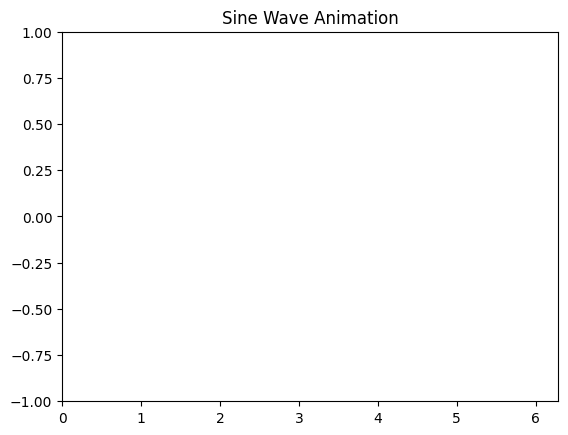

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Set up figure
fig, ax = plt.subplots()
xdata, ydata = [], []
(line,) = ax.plot([], [], lw=2)

ax.set_xlim(0, 2*np.pi)
ax.set_ylim(-1, 1)
ax.set_title("Sine Wave Animation")

# Initialize function
def init():
    line.set_data([], [])
    return (line,)

# Update function
def update(frame):
    xdata.append(frame)
    ydata.append(np.sin(frame))
    line.set_data(xdata, ydata)
    return (line,)

# Animate
frames = np.linspace(0, 2*np.pi, 100)
ani = FuncAnimation(fig, update, frames=frames,
                    init_func=init, blit=True, interval=50)

plt.show()

In [25]:
from IPython.display import HTML
HTML(ani.to_jshtml())

# 3.Version 1, North/South/East/West








## 3.1 Experimenting with movement

In [ ]:
import random
import numpy as np
import plotly.express as px

#start at position 0,0
position = (0,0)
print(position)

#set up the possible steps (up, down, left, and right)
directions = [(0,-1), (-1,0), (0,1), (1,0)]

#now we need to select one of those
step = random.choice(directions)
print(step)

#Add the tuples together
new_position = (position[0]+step[0], position[1]+step[1])
print(new_position)

#Let's repeat and see where the particle moves
step = random.choice(directions)
new_position = (new_position[0]+step[0], new_position[1]+step[1])
print(new_position)

#Now we should make a loop
#Maybe 100 steps?


#Uncomment below for loop version

'''
for i in range(100):
  step = random.choice(directions)
  new_position = (new_position[0]+step[0], new_position[1]+step[1])
  print(new_position)
'''

#Let's use a data structure to make this a little more elegant. See next code block



(0, 0)
(-1, 0)
(-1, 0)
(0, 0)


'\nfor i in range(100):\n  step = random.choice(directions)\n  new_position = (new_position[0]+step[0], new_position[1]+step[1])\n  print(new_position)\n'

## 3.2 Can we animate it?

In [29]:
#Here is sample code on animating a circle
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
ax.set_xlim(-5, 5)
ax.set_ylim(-5, 5)
particle, = ax.plot([], [], 'ro')

def update(frame):
    x = np.cos(frame)
    y = np.sin(frame)
    particle.set_data([x], [y])
    return particle,

plt.close(fig) #close the figure so you don't see the double display
ani = FuncAnimation(fig, update, frames=np.linspace(0, 10, 100), blit=True)
HTML(ani.to_jshtml())

In [34]:
from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import random
from IPython.display import HTML

# Parameters
directions = [(0,-1), (-1,0), (0,1), (1,0)]
num_frames = 100

# Initialize positions list
positions = [(10, 10)]  # start at (10,10)

# Create figure and axis once
fig, ax = plt.subplots()
ax.set_xlim(-50, 50)
ax.set_ylim(-50, 50)
ax.set_xlabel("X(t)")
ax.set_ylabel("Y(t)")
ax.set_title("Brownian Motion")

# Create initial plot (Line2D object)
line, = ax.plot([], [], 'r-')

# Frame update function
def frame(w):
    # pick a random step
    last_x, last_y = positions[-1]
    step = random.choice(directions)
    new_pos = (last_x + step[0], last_y + step[1])
    positions.append(new_pos)

    # update line data
    x, y = zip(*positions)
    line.set_data(x, y)

    return (line,)

# Run animation
ani = animation.FuncAnimation(fig, frame, frames=num_frames, blit=True, repeat=True)
plt.close(fig)  # avoid double display
HTML(ani.to_jshtml())

# 4.Version 2 adding random noise in x and y

## Simple random walk demonstration
### Code adapted from https://towardsdatascience.com/brownian-motion-with-python-9083ebc46ff0

In [40]:
from matplotlib import rc
rc('animation', html='jshtml')
from math import *
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation
fig = plt.figure(figsize=(8,6))
ax = plt.axes()

N=100
x=[]
y=[]
x.append(0.0)
y.append(0.0)

def frame(w):
    ax.clear()
    x.append(x[-1]+np.random.normal(loc=0.0,scale=10.0))
    y.append(y[-1]+np.random.normal(loc=0.0,scale=10.0))


    ax.set_title("Brownian Motion")
    ax.set_xlabel('X(t)')
    ax.set_xlim(-500,500)
    ax.set_ylabel('Y(t)')
    ax.set_ylim(-500,500)
    plot=ax.plot(x, y, c='r')


    return plot
anim = animation.FuncAnimation(fig, frame, frames=100, blit=False, repeat=True)
plt.close(fig) # prevents the static figure from displaying
HTML(anim.to_jshtml())  # shows only the animation

## 4.1 How to increase or decrease the "Diffusivity"?

Hint, what does "Scale" mean in the normal distribution?

# 5.Multiple particles (and multiple diffusivities?)


In [ ]:
#Could we include multiple particles and multiple diffusivities?

# 6.HW2

1. Use AI to generate a demonstration of brownian motion that has some kind of figure as an output. Provide a screenshot of the figure in your document for q1.

2. Provide commentary on this model. Specifically describe what the model does well and where the model might fail? How realistic is the model to how actual brownian motion occurs?


Upload your response to blackboard under HW1 as a .doc, .docx, or .pdf


# 7.Sample solutions

#7.? Cursed plotting

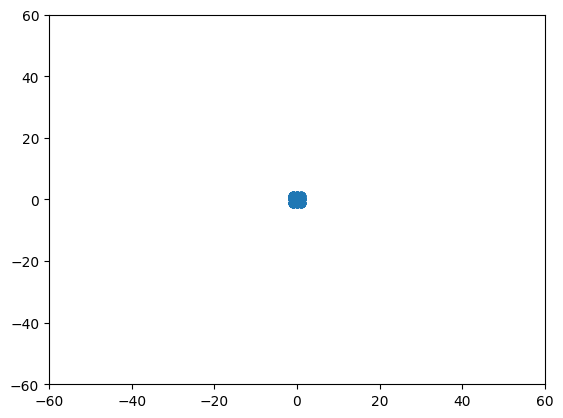

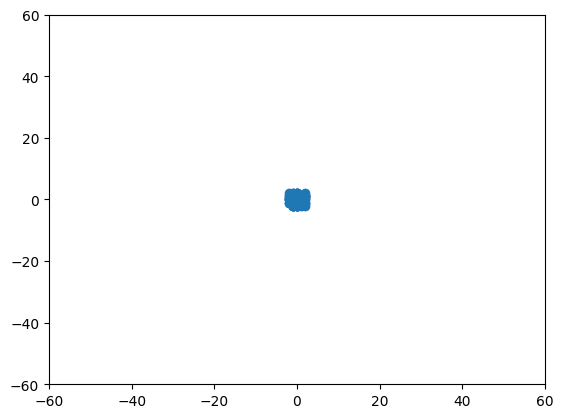

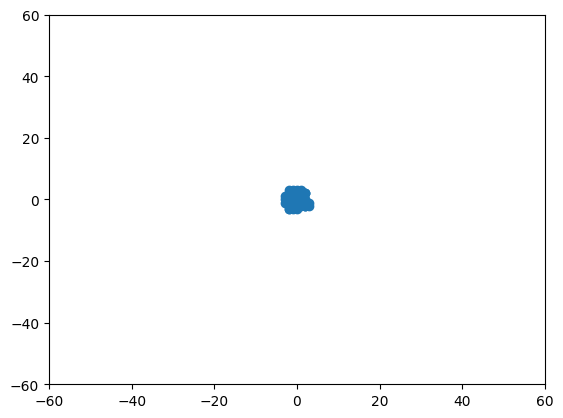

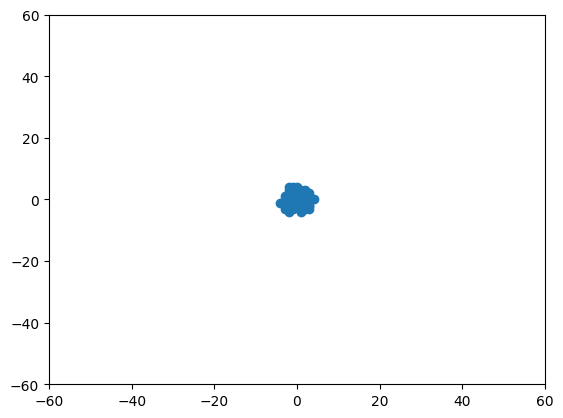

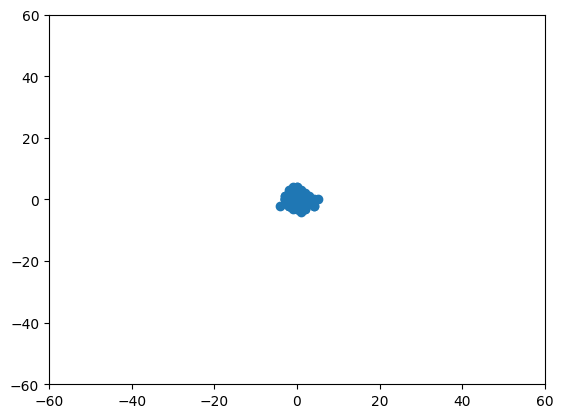

...

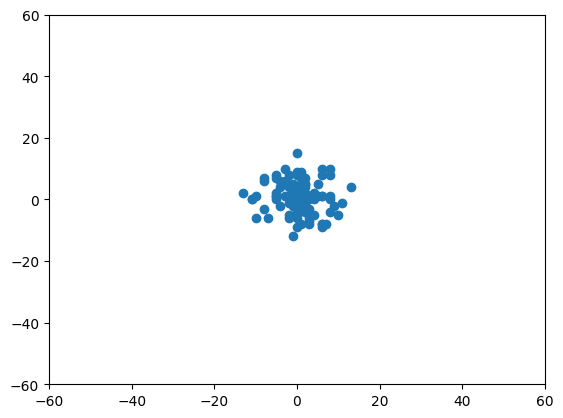

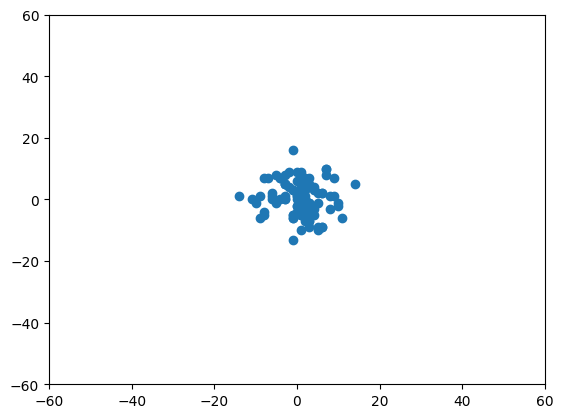

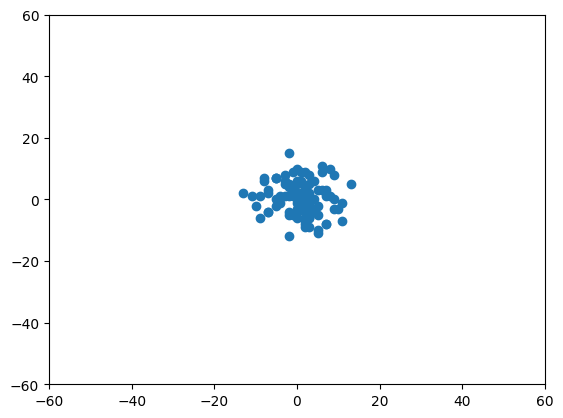

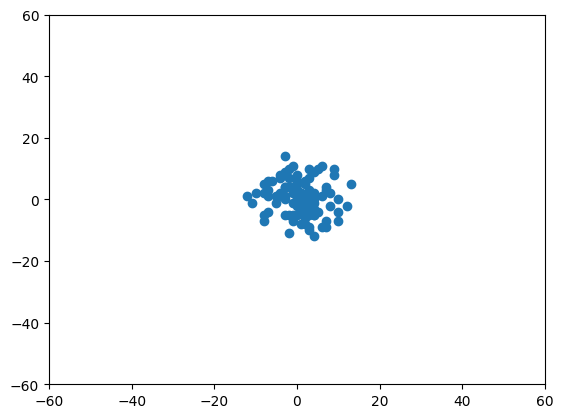

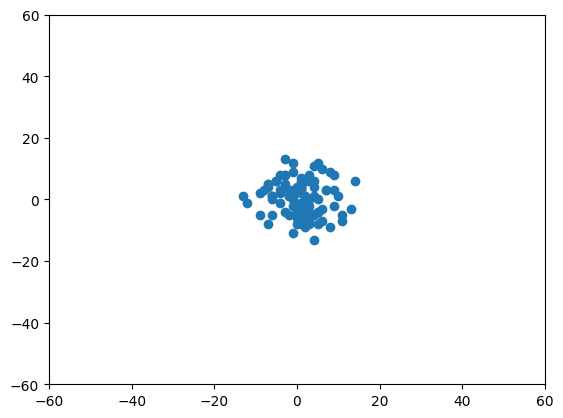

KeyboardInterrupt: 

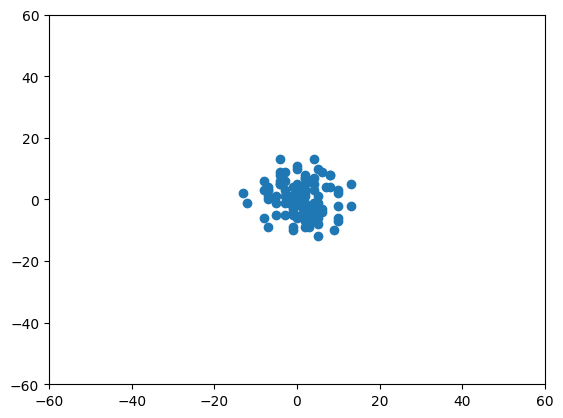

In [26]:
import numpy as np
import matplotlib.pyplot as plt

# Number of particles
particlenumber = 100

# Create an array for the particles (x,y,z)
particles = np.zeros((particlenumber, 3))

# Number of time steps
finaltime = 500

plt.ion()  # Turn on interactive plotting

for t in range(finaltime):
    # Add a random integer between -1 and 1 to each particle
    particles += np.random.randint(-1, 2, size=(particlenumber, 3))

    plt.clf()  # Clear the figure

    # --- 3D plot ---
    # from mpl_toolkits.mplot3d import Axes3D
    # ax = plt.axes(projection='3d')
    # ax.scatter(particles[:,0], particles[:,1], particles[:,2])
    # ax.set_xlim([-60, 60])
    # ax.set_ylim([-60, 60])
    # ax.set_zlim([-60, 60])

    # --- 2D example ---
    plt.scatter(particles[:,0], particles[:,1])
    plt.xlim([-60, 60])
    plt.ylim([-60, 60])

    plt.pause(0.01)

plt.ioff()
plt.show()

#7.? GIF version

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter

# Number of particles
particlenumber = 100

# Create an array for the particles (x,y,z)
particles = np.zeros((particlenumber, 3))

# Number of time steps
finaltime = 200  # smaller for faster GIF export

fig, ax = plt.subplots(figsize=(5,5))

# Initialize the scatter plot
scat = ax.scatter(particles[:,0], particles[:,1])
ax.set_xlim([-60, 60])
ax.set_ylim([-60, 60])
ax.set_title("2D Random Walk of Particles")

# Update function for each frame
def update(frame):
    global particles
    particles += np.random.randint(-1, 2, size=(particlenumber, 3))
    scat.set_offsets(particles[:, :2])  # update X, Y only
    return scat,

# Create animation
ani = FuncAnimation(fig, update, frames=finaltime, interval=50, blit=True)

# Save as GIF
ani.save("particles.gif", writer=PillowWriter(fps=20))

plt.close(fig)  # Close to avoid duplicate static plot

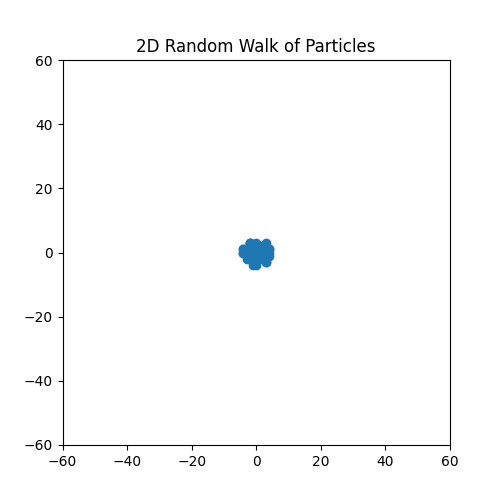

In [ ]:
from IPython.display import Image
Image(filename="particles.gif")

## 7.? Two particles version

In [ ]:
from matplotlib import rc
rc('animation', html='jshtml')
from math import *
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import matplotlib.animation as animation
fig = plt.figure(figsize=(8,6))
ax = plt.axes()

N=100
x=[]
y=[]
x.append(0.0)
y.append(0.0)

x1=[]
y1=[]
x1.append(0.0)
y1.append(0.0)


def frame(w):
    ax.clear()
    x.append(x[-1]+np.random.normal(loc=0.0,scale=10.0))
    y.append(y[-1]+np.random.normal(loc=0.0,scale=10.0))

    x1.append(x1[-1]+np.random.normal(loc=0.0,scale=50.0))
    y1.append(y1[-1]+np.random.normal(loc=0.0,scale=50.0))

    ax.set_title("Brownian Motion")
    ax.set_xlabel('X(t)')
    ax.set_xlim(-500,500)
    ax.set_ylabel('Y(t)')
    ax.set_ylim(-500,500)
    plot=ax.plot(x, y, c='r')


    plot=ax.plot(x1,y1,c='b')
    return plot
anim = animation.FuncAnimation(fig, frame, frames=100, blit=False, repeat=True)
plt.close(fig) # prevents the static figure from displaying
HTML(anim.to_jshtml())  # shows only the animation